In [3]:
# dataset: https://www.kaggle.com/datasets/mnassrib/telecom-churn-datasets

# Importing initial libraries
import sklearn as sk
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
# Loading dataset using pandas
training_ds = r'churn-bigml-80.csv'
training_ds = pd.read_csv(training_ds)

training_ds.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [5]:
# Checking for null values
print(training_ds.isnull().sum())

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64


In [6]:
# Exploring descriptive statistics
training_ds.describe()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,2666.000000,2666.000000,2666.000000,2666.00000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000,2666.000000
mean,100.620405,437.438860,8.021755,179.48162,100.310203,30.512404,200.386159,100.023631,17.033072,201.168942,100.106152,9.052689,10.237022,4.467367,2.764490,1.562641
std,39.563974,42.521018,13.612277,54.21035,19.988162,9.215733,50.951515,20.161445,4.330864,50.780323,19.418459,2.285120,2.788349,2.456195,0.752812,1.311236
min,1.000000,408.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,43.700000,33.000000,1.970000,0.000000,0.000000,0.000000,0.000000
25%,73.000000,408.000000,0.000000,143.40000,87.000000,24.380000,165.300000,87.000000,14.050000,166.925000,87.000000,7.512500,8.500000,3.000000,2.300000,1.000000
50%,100.000000,415.000000,0.000000,179.95000,101.000000,30.590000,200.900000,100.000000,17.080000,201.150000,100.000000,9.050000,10.200000,4.000000,2.750000,1.000000
75%,127.000000,510.000000,19.000000,215.90000,114.000000,36.700000,235.100000,114.000000,19.980000,236.475000,113.000000,10.640000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,50.000000,350.80000,160.000000,59.640000,363.700000,170.000000,30.910000,395.000000,166.000000,17.770000,20.000000,20.000000,5.400000,9.000000


**Observation**

At first glance, it seems that this data may have outliers. Confirming this speculation with Explanatory Data Analysis (EDA) is crucial.

In [7]:
# Exploring data types for all columns
training_ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

**Explanatory Data Analysis (EDA)**

**Categorical Features**

**Assumption**: Having an international plans and voice mail plan can directly impact the chances that a customer may churn or not as these features may be essential to a few due to customer needs and feature satisfaction. Below, we'll be exploring if these tow features have a direct and a strong impact on the churn in the given dataset.

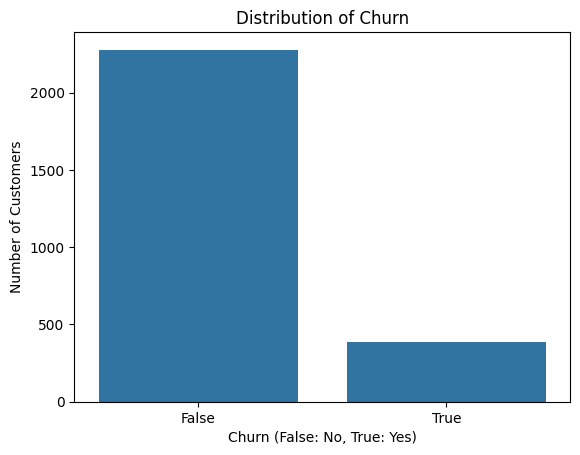

Churn
False    85.446362
True     14.553638
Name: proportion, dtype: float64


In [8]:
# Churn distribution

plt.Figure(figsize= (6,6))
sns.countplot(data= training_ds, x= 'Churn')
plt.title('Distribution of Churn')
plt.xlabel('Churn (False: No, True: Yes)')
plt.ylabel('Number of Customers')
plt.show()

print(training_ds['Churn'].value_counts(normalize=True) * 100)


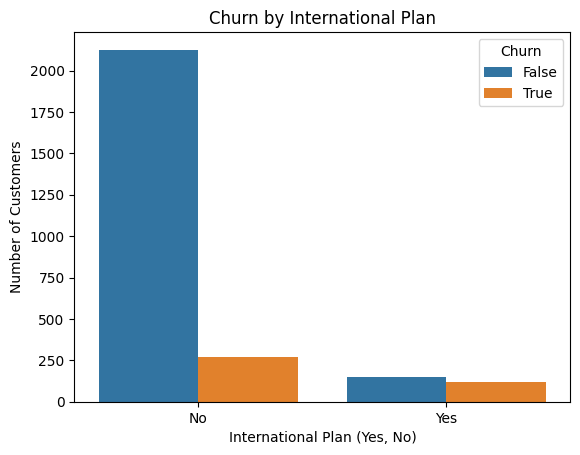

International plan  Churn
No                  False    88.731219
                    True     11.268781
Yes                 False    56.296296
                    True     43.703704
Name: proportion, dtype: float64


In [9]:
# Relation between Churn and customers with an International Plan

plt.Figure(figsize= (6,6))
sns.countplot(data= training_ds, x= 'International plan', hue= 'Churn')
plt.title('Churn by International Plan')
plt.xlabel('International Plan (Yes, No)')
plt.ylabel('Number of Customers')
plt.show()

print(training_ds.groupby('International plan')['Churn'].value_counts(normalize= True) * 100)

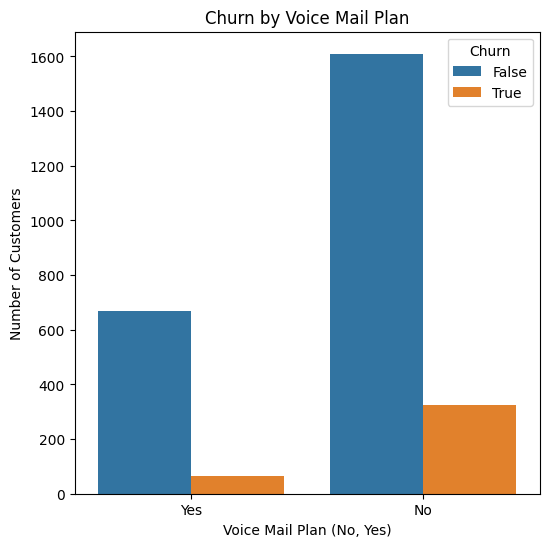

Voice mail plan  Churn
No               False    83.290222
                 True     16.709778
Yes              False    91.132333
                 True      8.867667
Name: proportion, dtype: float64


In [10]:
plt.figure(figsize=(6, 6))
sns.countplot(data=training_ds, x='Voice mail plan', hue='Churn')
plt.title('Churn by Voice Mail Plan')
plt.xlabel('Voice Mail Plan (No, Yes)')
plt.ylabel('Number of Customers')
plt.show()

print(training_ds.groupby('Voice mail plan')['Churn'].value_counts(normalize=True) * 100)

**Observations**

Based off of the results above, we can conclude that the customers with an international plan had a higher churn rate of approximately 43.7%. This translates into a substantial impact on the likelihood of churn.

Customers with a voice mail plan had a low churn rate of approximately 8.9%. We can conclude that having a voice mail plan is associated with a lower churn rate and the customers with this plan are less likely to leave.

**Numerical Features**

We'll be using box plots as a starting point for our EDA. This will allow easier observation of any outliers in the given dataset.

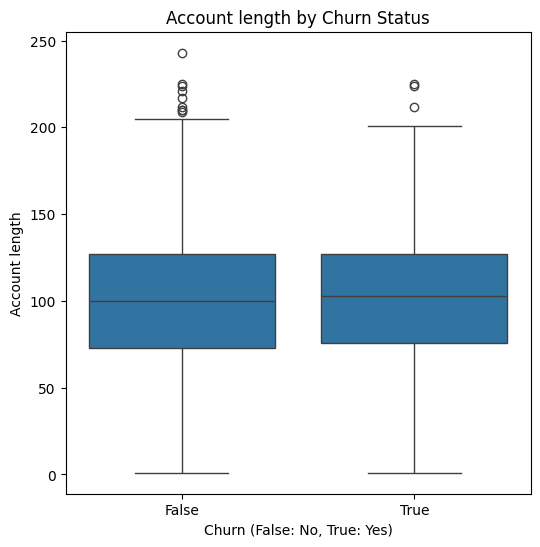

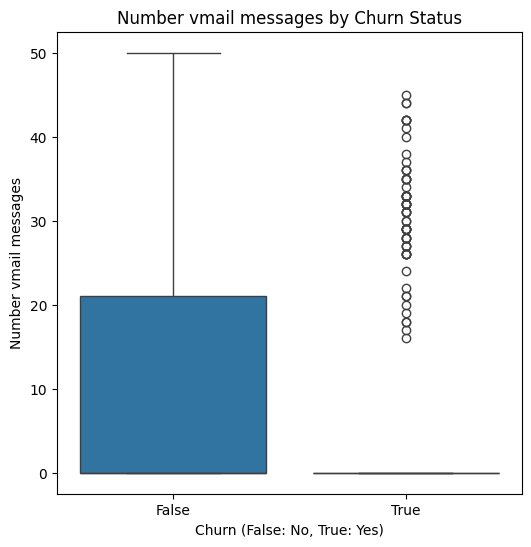

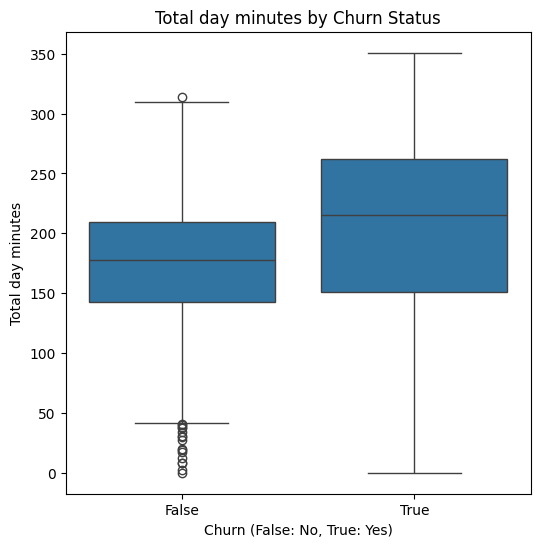

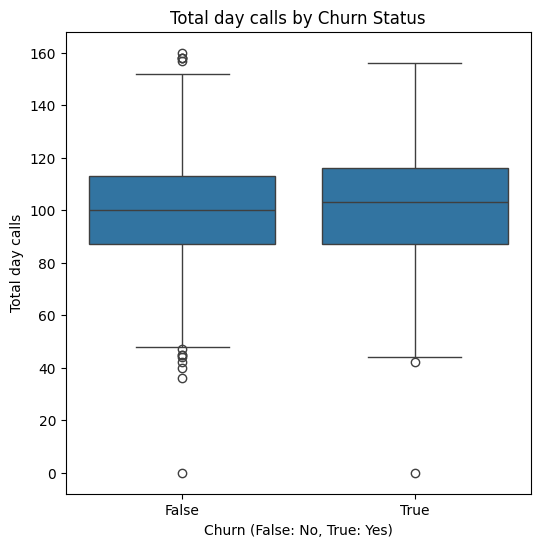

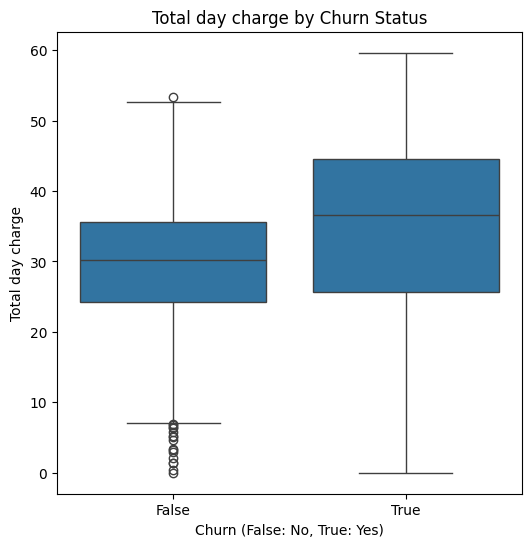

...

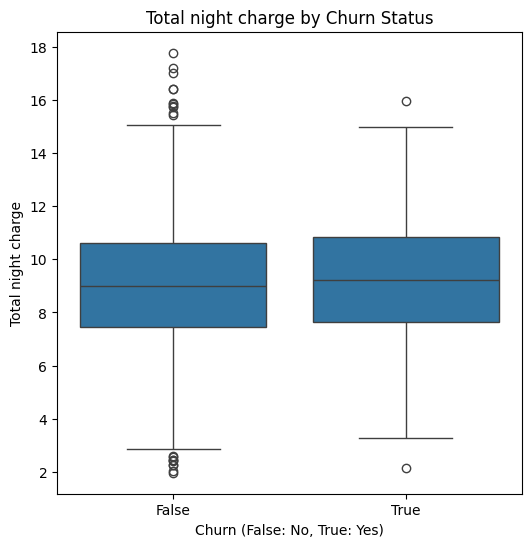

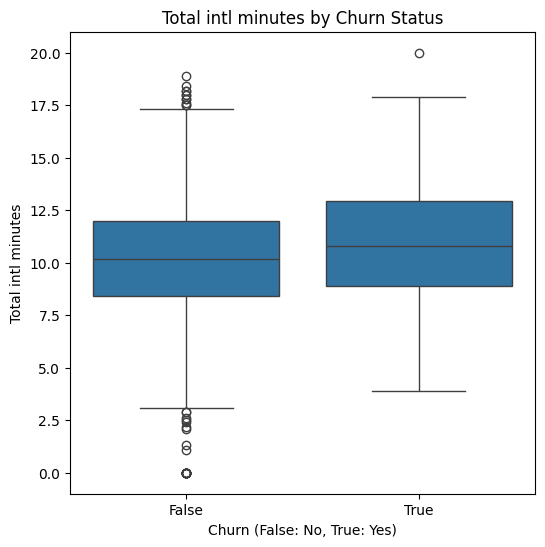

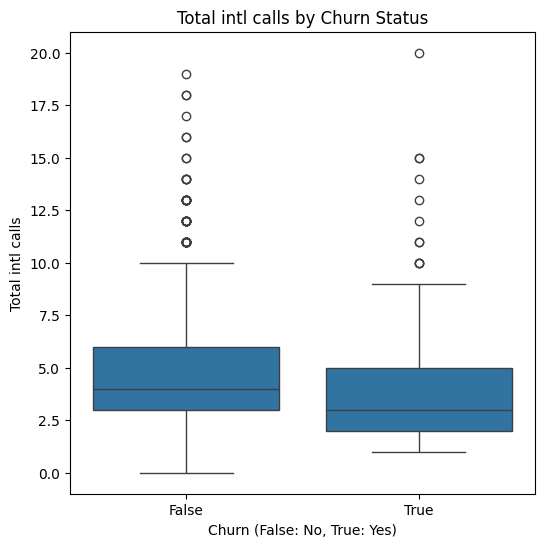

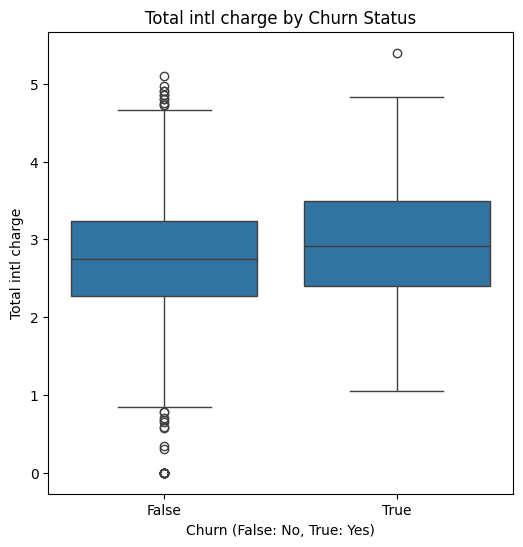

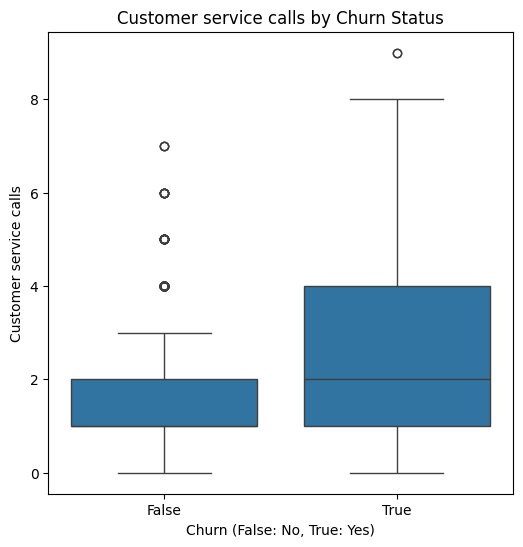

In [11]:
# List of all numerical columns
numerical_cols = ['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']

# Box plots for each numerical column.
for col in numerical_cols:
    plt.figure(figsize= (6,6))
    sns.boxplot(data= training_ds, x= 'Churn', y= col)
    plt.title(f'{col} by Churn Status')
    plt.xlabel('Churn (False: No, True: Yes)')
    plt.ylabel(col)
    plt.show()

**Heatmap To Find Correlation Between Each Feature**

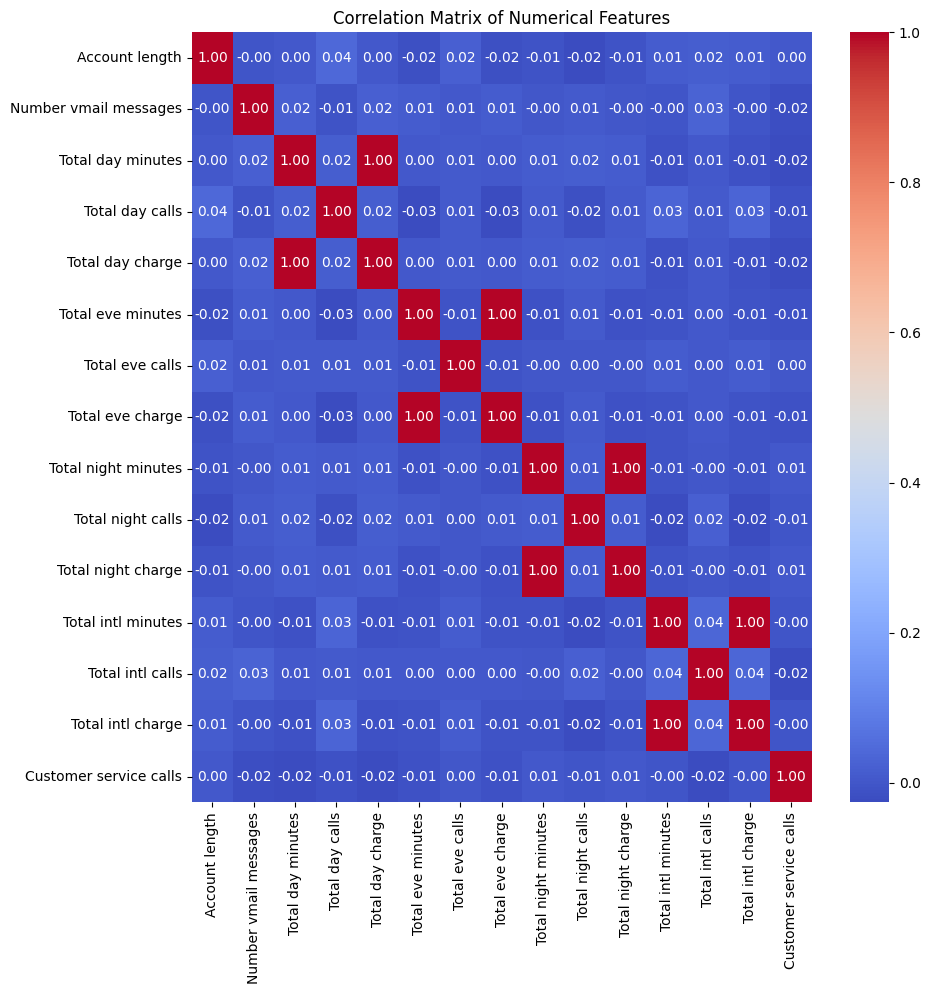

In [12]:
correlation_matrix = training_ds[numerical_cols].corr()
plt.figure(figsize= (10, 10))
sns.heatmap(correlation_matrix, annot= True, fmt= '.2f', cmap= 'coolwarm')
plt.title('Correlation Matrix of Numerical Features')
plt.show()


**Pairplots For Visualizing Pairwise Relationships Between Multiple Numerical Features**

Expand the graph for a better view

Focused features pairplot is provided below

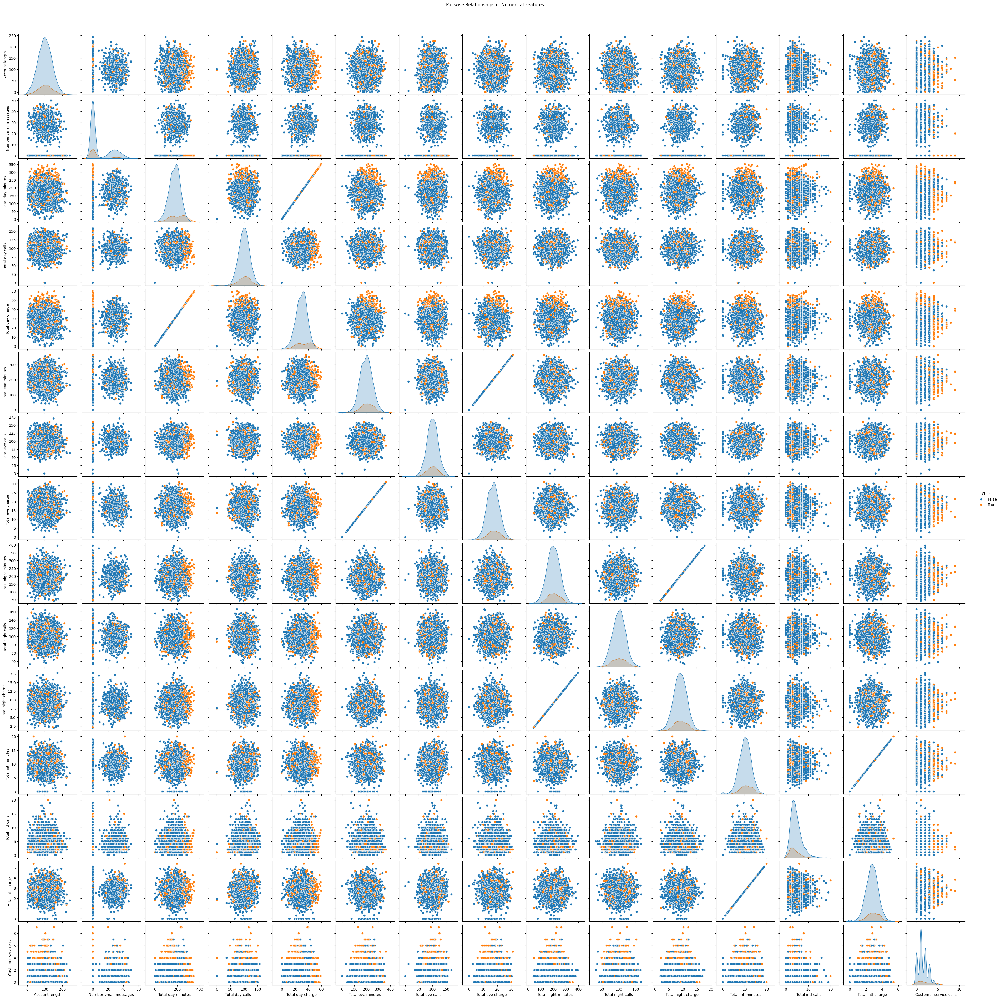

In [13]:
numerical_cols_with_churn = numerical_cols + ['Churn']

sns.pairplot(training_ds[numerical_cols_with_churn], hue= 'Churn')
plt.suptitle('Pairwise Relationships of Numerical Features', y= 1.02)
plt.show()

Generating focused pairplots for easier analysis

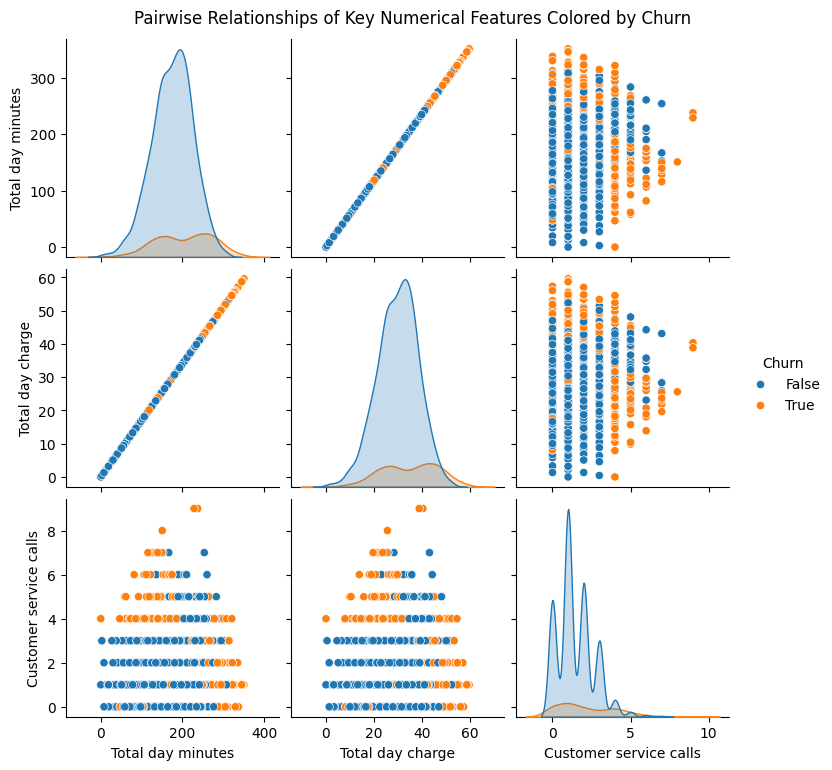

In [14]:
# Pair plot for day time features and customer service calls feature
day_time_cols = ['Total day minutes', 'Total day charge', 'Customer service calls', 'Churn']

sns.pairplot(data=training_ds[day_time_cols], hue='Churn')
plt.suptitle('Pairwise Relationships of Key Numerical Features Colored by Churn', y=1.02    )
plt.show()

**Observations**

* Total day minutes and total day charge shows a clear linear, upwards trend. This is expected as they are correlated.
* The churn is pretty high as soon as approximately 250 total day minutes mark is reached.
* High customer service calls are related to higher churn even with average amount of total day minutes.
* The churn risk increases due to the combination of the two factors, the total day minutes and the customer service calls. Its not one or the other.
* High call volume to customer service, even with moderate usage, suggests a customer experiencing issues or dissatisfaction that isn't tied directly to extreme usage.


**Suggestions**

* Customers with moderate usage but higher customer service calls are at a higher risk for churn. Proactive retention offers can be used for said customers.
* A more tailored package can be provided to those who have higher total day time calls to match their needs.
* Providing proactive FAQs can reduce customer interaction with customer service. This also provides a sense of accomplishment if the customer can solve their problem on their own with simple yet guided steps.
* Total day charge linearly goes up with total day minutes. Considering this, the offerings can be tailored in a way that the costs are saved elsewhere while providing this specific subset of customers with better day time call charges to reduce churn proactively.

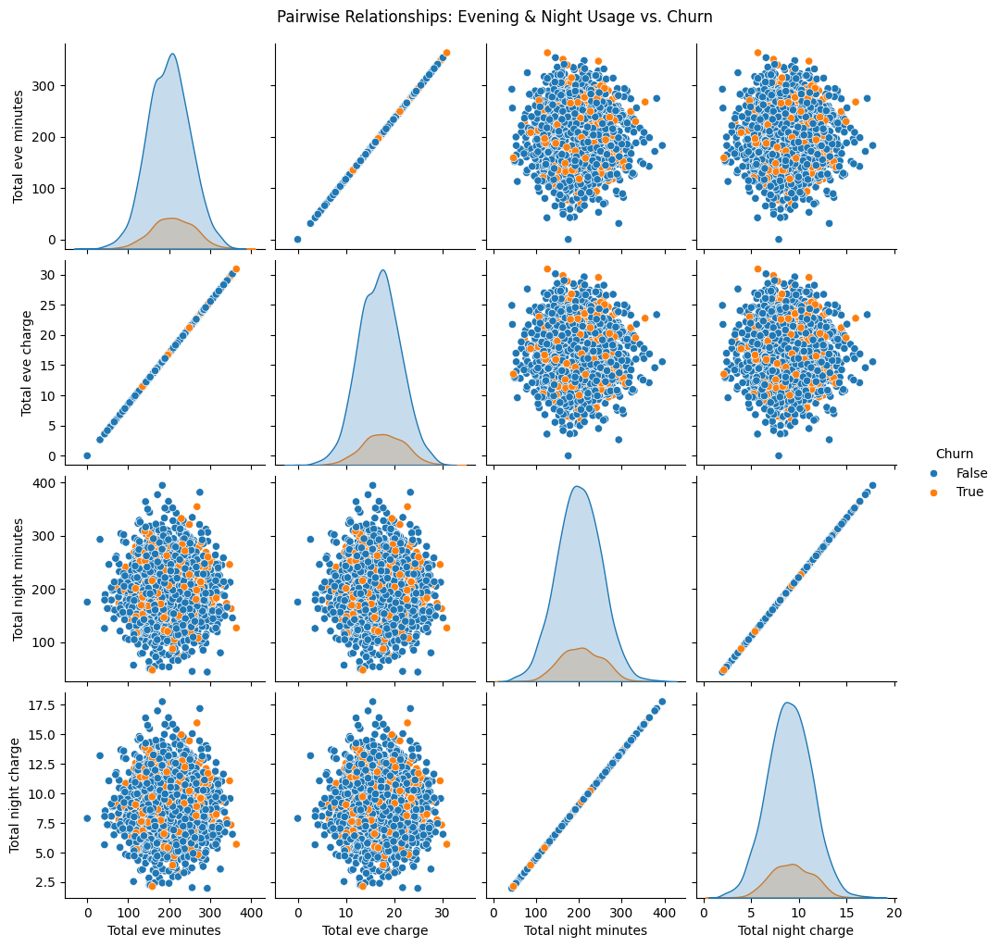

In [15]:
# Pair plot for evening and night features
evening_night_cols = ['Total eve minutes', 'Total eve charge','Total night minutes', 'Total night charge', 'Churn']

sns.pairplot(data=training_ds[evening_night_cols], hue='Churn')
plt.suptitle('Pairwise Relationships: Evening & Night Usage vs. Churn', y=1.02)
plt.show()

**Observation**

The visual patterns are scattered, suggesting no clear linear relationship or distinct separation based on churn status.

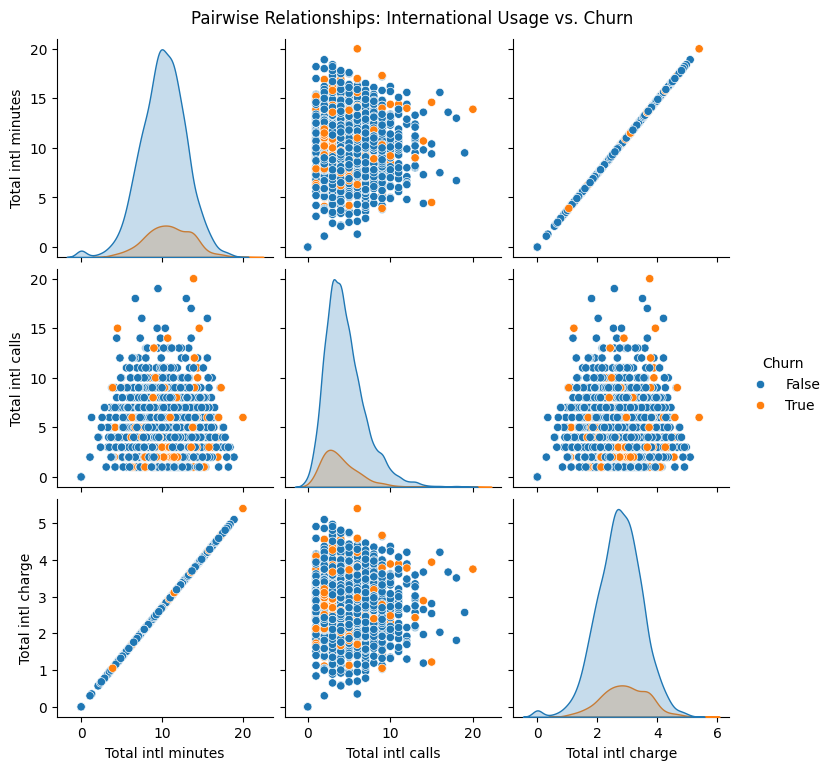

In [16]:
# Pair plot for international features
international_cols = ['Total intl minutes', 'Total intl calls', 'Total intl charge', 'Churn']

sns.pairplot(data=training_ds[international_cols], hue='Churn')
plt.suptitle('Pairwise Relationships: International Usage vs. Churn', y=1.02)
plt.show()

**Observation**

The visual patterns are scattered, suggesting no clear linear relationship or distinct separation based on churn status.

**Data Preprocessing For Predictive Modeling**

There are two approaches that can be taken from this point.

* Standardizing and/or normalizing the data depending
* Picking a predictive model that is not sensitive to outliers as this will make it so that standardization or normalization is not required.

We'll be using trees as our predictive model of choice since they are less sensitive to outliers. This reduces possibility of data leak during standardization or normalization as well as it reduces the overall run time, providing better performance in terms of efficiency/speed.

In [17]:
# Encoding categorical features and label to numerical format for predictive modeling. 
# The 'State' and 'Area code' columns were dropped because their limited direct predictive power could introduce noise and increase model complexity without significantly contributing to identifying core churn drivers.
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
training_ds = training_ds.drop(['State','Area code'], axis= 1)

label_encoder = LabelEncoder()

X = training_ds.drop('Churn', axis= 1)
y = label_encoder.fit_transform(training_ds['Churn'])
X.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [18]:
# Verifying if label encoder encoded the labels properly.
print(label_encoder.classes_)
print(y)

[False  True]
[0 0 0 ... 0 0 0]


In [19]:
# Splitting dataset between training and testing with a split of 70:30
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.30)

In [20]:
ordinal_encoder = OrdinalEncoder()
ordinal_encoder.fit(X_train[['International plan', 'Voice mail plan']])

X_train[['International plan', 'Voice mail plan']] = ordinal_encoder.transform(X_train[['International plan', 'Voice mail plan']])
X_test[['International plan', 'Voice mail plan']] = ordinal_encoder.transform(X_test[['International plan', 'Voice mail plan']])

In [21]:
X_train.head()

,Account length,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
2255,30,0.0,0.0,0,54.0,68,9.18,179.3,96,15.24,247.2,101,11.12,10.2,8,2.75,1
1572,114,0.0,1.0,4,141.3,96,24.02,230.4,88,19.58,223.7,85,10.07,9.4,3,2.54,3
715,73,0.0,0.0,0,214.2,90,36.41,196.8,78,16.73,157.9,112,7.11,5.9,8,1.59,0
699,73,0.0,0.0,0,254.8,85,43.32,143.4,80,12.19,153.9,102,6.93,15.0,7,4.05,2
1243,105,0.0,1.0,27,141.2,96,24.00,167.7,94,14.25,274.4,101,12.35,11.4,2,3.08,1


In [22]:
# Our model of choice is Random Forest Classifier and Decision Tree Classifier. Default hyperparameters are being used for training and inference.
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score

RF_classifier = RandomForestClassifier()
DT_classifier = DecisionTreeClassifier()

RF_classifier.fit(X_train, y_train)
RF_pred = RF_classifier.predict(X_test)

DT_classifier.fit(X_train, y_train)
DT_pred = DT_classifier.predict(X_test)

**Random Forest Metrics**

**Observation**

Random Forest Classifier seems to be very accurate at first glance. The metrics are in acceptable range as well.

Accuracy for random forest classifier: 0.9475
ROC-AUC score for random forest classifier: 0.847801675736374


<Axes: >

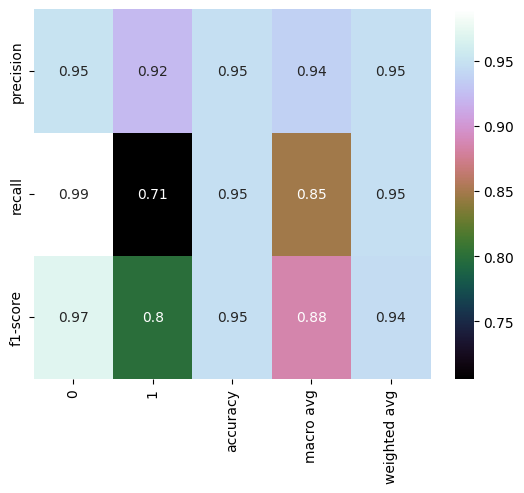

In [23]:
print(f'Accuracy for random forest classifier: {accuracy_score(y_test, RF_pred)}')
print(f'ROC-AUC score for random forest classifier: {roc_auc_score(y_test, RF_pred)}')

report = pd.DataFrame(classification_report(y_test, RF_pred, output_dict= True)).iloc[:-1]

sns.heatmap(data= report, annot= True, fmt= '.2g', cmap= 'cubehelix')

**Decision Tree Metrics**

**Observation**

Decision Tree Classifier while being accurate compared to random guessing - is not accurate enough compared to Random Forest Classifier.

Accuracy for decision tree classifier: 0.9025
ROC-AUC score for decision tree classifier: 0.8040326262663655


<Axes: >

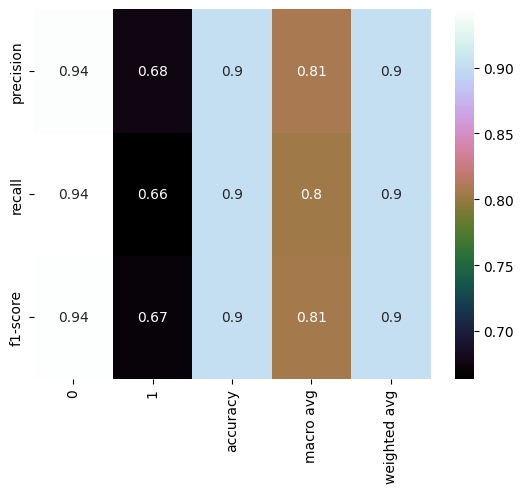

In [24]:
print(f'Accuracy for decision tree classifier: {accuracy_score(y_test, DT_pred)}')
print(f'ROC-AUC score for decision tree classifier: {roc_auc_score(y_test, DT_pred)}')

report = pd.DataFrame(classification_report(y_test, DT_pred, output_dict= True)).iloc[:-1]

sns.heatmap(data= report, annot= True, fmt= '.2g', cmap= 'cubehelix')

**Observations**

* Random forest classifier performs better when doing inference on testing dataset.
* Tree based classifiers are less prone to outliers. These two were selected as the model of choice due to that reason and the speed to performance ratio.
* Decision tree classifier seems to be underfitted based on the confusion matrix provided by the classification report.
* Random forest classifier is not overfitted. The high accuracy, precision, recall, and f1-score stay consistent when using testing data.

**Based off of above observations, using random forest classifier for inference on fresh data**

In [25]:
fresh_ds = pd.read_csv('churn-bigml-20.csv')

fresh_ds.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


Applying the same preprocessing on the fresh data.

In [26]:
X = fresh_ds.drop(['Area code', 'State', 'Churn'], axis= 1)
X[['International plan', 'Voice mail plan']] = ordinal_encoder.transform(X[['International plan', 'Voice mail plan']])

y = fresh_ds['Churn']
y = label_encoder.transform(y)

In [27]:
fresh_pred = RF_classifier.predict(X)

**Observation**

The Random Forest Classifier performs extremely well on fresh data. This result also confirms that there were no data leaks present during the preprocessing and splitting process which could have caused better results during the inference on testing data. Random Forest Classifier would be the best model in this particular scenario due to its good efficiency/speed with high accuracy as shown by the metrics

Accuracy for random forest classifier on fresh data: 0.952023988005997
ROC-AUC score for random forest classifier on fresh data: 0.8535241074714759


<Axes: >

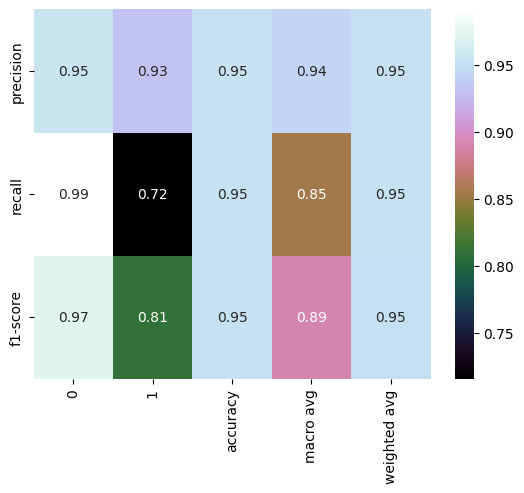

In [28]:
print(f'Accuracy for random forest classifier on fresh data: {accuracy_score(y, fresh_pred)}')
print(f'ROC-AUC score for random forest classifier on fresh data: {roc_auc_score(y, fresh_pred)}')

report = pd.DataFrame(classification_report(y, fresh_pred, output_dict= True)).iloc[:-1]

sns.heatmap(data= report, annot= True, fmt= '.2g', cmap= 'cubehelix')

**For Future Additions**

* Possibly creating an interactive Tableau dashboard with these data visualizations.
* While not necessary as the results are quite good with the current model. Using deep learning and using a neural network to compare results between the two models.
* Hyperparameter tuning to potentially explore if the model performs better or is underfitted/overfitted while maintaining the efficiency/speed at the same time.